In [1]:
import numpy as np
import pandas as pd
from scipy.stats import zscore
from scipy import sparse 
from scipy.spatial import ConvexHull
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

import scanpy as sc
from py_pcha import PCHA

In [2]:
import os
import numpy as np
import pandas as pd
import scanpy as sc
import anndata 
import seaborn as sns
from scipy.stats import zscore
import matplotlib.pyplot as plt
import collections
from natsort import natsorted
import re

from scipy import stats
from scipy import sparse
from sklearn.decomposition import PCA
from umap import UMAP

from matplotlib.colors import LinearSegmentedColormap

from scroutines.config_plots import *
from scroutines import powerplots # .config_plots import *
from scroutines import pnmf
from scroutines import basicu
from scroutines.gene_modules import GeneModules  


In [3]:
import numpy as np
import pandas as pd
from scipy.stats import zscore
from scipy import sparse 
from scipy.spatial import ConvexHull
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

import scanpy as sc
from py_pcha import PCHA

from scipy.stats import gaussian_kde

In [4]:
from scipy import stats
from matplotlib.ticker import MaxNLocator

def plot3(x, y, hue, aspect_equal=False, s=10, vmin=-2.5, vmax=2.5, vminp=None, vmaxp=None, cmap='coolwarm'):
    n = len(cases_nr_short)
    fig, axs = plt.subplots(1,n,figsize=(4*n,4*1), sharex=True, sharey=True)
    fig.suptitle(hue, x=0, ha='left')
    
    showall = res[res['cond'].isin(cases_nr_short)]
    if vminp is not None:
        vmin = np.percentile(showall[hue], vminp)
    if vmaxp is not None:
        vmax = np.percentile(showall[hue], vmaxp)
            
    for i, (ax, cond) in enumerate(zip(axs.flat, cases_nr_short)):
        ax.set_title(cond)
        show = res[res['cond']==cond]
        
        ax.scatter(
                   show[x], show[y], c=show[hue], 
                   cmap=cmap,
                   vmin=vmin, vmax=vmax,
                   s=s, 
                   edgecolor='none', 
                   rasterized=True,
                  )
            
        sns.despine(ax=ax)
        ax.xaxis.set_major_locator(MaxNLocator(nbins=3))
        ax.yaxis.set_major_locator(MaxNLocator(nbins=3))
        if aspect_equal:
            ax.set_aspect('equal')
        if i == 0: 
            ax.set_xlabel(x)
            ax.set_ylabel(y)
        else:
            ax.set_xlabel('')
            ax.set_ylabel('')
        ax.grid(False)
        ax.set_xticks([])
        ax.set_yticks([])
    fig.tight_layout()
    
    return fig
    # plt.show()

In [5]:
def norm(x, depths):
    """
    Arguments: 
        x - cell by gene count matrix
        depths - sequencing depth per cell
        
    Output:
        xn - normalized count matrix

    This function takes raw counts as the input, and does the following steps sequencially.
         1. size normalization (CP10k) 
         2. log1p normalization (base 2 - log2(1+CP10k))
         3. zscore per gene  
    """

    xn = x/depths.reshape(-1,1)*1e4
    xn = np.log2(1+xn)
    xn = zscore(xn, axis=0)

    if np.any(np.isnan(xn)):
        print('Warning: the normalized matrix contains nan values. Check input.')
        xn = np.nan_to_num(xn, 0)

    return xn

In [6]:
def proj(x_norm, ndim, method='PCA'):
    """
    Arguments: 
        x_norm - normalized cell by gene feature matrix
        ndim   - number of dimensions

    Output:
        x_proj - a low-dimensional representation of `x_norm` 

    Here we only implemented PCA - a common projection method widely used, including by
    Adler et al. 2019 and Xie et al. 2024 for the Achetypal Analysis of scRNA-seq data.

    In principle, one can also choose to use other projection methods as needed.
    """

    if method == 'PCA':
        x_proj = PCA(n_components=ndim).fit_transform(x_norm)
    else:
        raise ValueError('methods other than PCA are not implemented...')

    return x_proj


In [7]:
def pcha(X, noc=3, delta=0, **kwargs):
    """
    """
    XC, S, C, SSE, varexpl = PCHA(X, noc=noc, delta=delta, **kwargs)
    XC = np.array(XC)
    XC = XC[:,np.argsort(XC[0])] # assign an order according to x-axis 
    return XC 

In [8]:
def downsamp(x, which='cell', p=0.8, seed=None):
    """
    Arguments:
        x - cell by gene matrix
        which - downsample cells (rows) or genes (columns)
        p - fraction of cells/genes to keep - should be a value between ~ [0,1]
    """
    n0, n1 = x.shape
    
    rng = np.random.default_rng(seed=seed)
    
    if which in [0, 'cell', 'row']:
        return x[rng.random(n0)<p, :]
    elif which in [1, 'gene', 'col', 'column']:
        return x[:, rng.random(n1)<p]
    else:
        raise ValueError('choose from cell or gene')

In [9]:
def shuffle_rows_per_col(x, seed=None):
    """
    Arguments:
       x - cell by gene matrix
       seed - a random seed for reproducibility
    
    shuffles entries across rows (cells) independently for each col (gene)
    """
    rng = np.random.default_rng(seed=seed)
    x_shuff = rng.permuted(x, axis=0)
    return x_shuff

In [10]:
def plot_archetype(ax, aa, fmt='--o', color='k', **kwargs):
    """
    """
    ax.plot(aa[0].tolist()+[aa[0,0]], aa[1].tolist()+[aa[1,0]], fmt, color=color, **kwargs)

In [11]:
def get_t_ratio(xp, aa):
    """
    Arguments:
     xp -- projected matrix (cell by 2)
     aa -- inferred archetypes (2 by noc)
     note that this function only works for 2-dimensional space only
     
    Return: 
     t-ratio - ratio of areas (convex hull vs PCH)
     
    """
    assert xp.shape[1] == aa.shape[0] == 2
    
    ch_area  = ConvexHull(xp).volume
   
    x = aa[0]
    y = aa[1]
    pch_area = 0.5*np.abs(np.dot(x,np.roll(y,1))-np.dot(y,np.roll(x,1)))

    return ch_area/pch_area 

In [12]:
class SingleCellArchetype():
    """
    """
    def __init__(self, x, depths, types):
        """
        Arguments: 
            x - cell by gene count matrix
            depths - sequencing depth per cell
            types  - cell type labels per cell
        
        Initiate the SingleCellArchetype object

        """
        
        # input
        self.x = x
        self.depths = depths
        self.types = types
        
        # cell type label
        types_idx, types_lbl = pd.factorize(types, sort=True)
        
        self.types_idx = types_idx
        self.types_lbl = types_lbl 
        
        # normalize
        self.xn = norm(self.x, self.depths)
        
        # feature matrix 
        self.xf = None 
        return 
        
    def setup_feature_matrix(self, method='data'):
        """
        """
        if method == 'data': 
            self.xf = self.xn
            print('use data')
            return  
        
        elif method == 'gshuff':
            # shuffle gene expression globally across all cells
            self.xf = shuffle_rows_per_col(self.xn)
            print('use shuffled data')
            return
            
        elif method == 'tshuff':
            # shuff each gene across cells independently - internally for each type A,B,C
            xn = self.xn
            xn_tshuff = xn.copy()
            
            types_lbl = self.types_lbl
            types_idx = self.types_idx
            for i in range(len(types_lbl)):
                xn_tshuff[types_idx==i] = shuffle_rows_per_col(xn[types_idx==i])
            self.xf = xn_tshuff
            print('use per-type shuffled data')
            return
        else:
            raise ValueError('choose from (data, gshuff, tshuff)')
    
    def proj_and_pcha(self, ndim, noc, **kwargs):
        """
        """
        xp = proj(self.xf, ndim)
        aa = pcha(xp.T, noc=noc, **kwargs)
        
        self.xp = xp
        self.aa = aa
        return (xp, aa)
        
    def downsamp_proj_pcha(self, ndim, noc, nrepeats=10, which='cell', p=0.8, **kwargs): 
        """
        """
        aa_dsamps = []
        for i in range(nrepeats):
            xn_dsamp = downsamp(self.xf, which=which, p=p)
            xp_dsamp = proj(xn_dsamp, ndim)
            aa_dsamp = pcha(xp_dsamp.T, noc=noc, **kwargs)
            aa_dsamps.append(aa_dsamp)
            
        return aa_dsamps
    
    def t_ratio_test(self, ndim, noc, nrepeats=10, **kwargs): 
        """
        this only work for 2-dimensional space for now
        """
        assert ndim == 2
        
        self.setup_feature_matrix(method='data')
        xp, aa = self.proj_and_pcha(ndim, noc)
        t_ratio = get_t_ratio(xp, aa)
        
        t_ratios_shuff = []
        for i in range(nrepeats):
            self.setup_feature_matrix(method='gshuff')
            xp_shuff, aa_shuff = self.proj_and_pcha(ndim, noc)
            t_ratio_shuff = get_t_ratio(xp_shuff, aa_shuff)
            t_ratios_shuff.append(t_ratio_shuff)
            
        pvalue = (np.sum(t_ratio > t_ratios_shuff)+1)/nrepeats
        
        return t_ratio, t_ratios_shuff, pvalue

In [13]:
outdirfig = "/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/figures/250407"
!mkdir -p $outdirfig

# load data 

In [14]:
f_anndata_in  = "../../data/v1_multiome/superdupermegaRNA_hasraw_multiome_L23.h5ad"
adata = anndata.read(f_anndata_in)
adata

AnnData object with n_obs × n_vars = 38539 × 16521
    obs: 'Age', 'Doublet', 'Doublet Score', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'Type', 'Subclass', 'Class', 'Sample', 'total_counts', 'pct_counts_mt', 'n_genes_by_counts', 'total_counts_mt', 'Doublet?', 'Study', 'Type_leiden', 'time'
    var: 'feature_types'
    layers: 'norm'

In [15]:
sample_labels = ["-".join(cell.split(' ')[0].split('-')[2:]).replace('-2023', '') for cell in adata.obs.index]
time_labels = [s[:-1].replace('DR', '') for s in sample_labels]

adata.obs['sample'] = sample_labels
adata.obs['time']   = time_labels

uniq_samples = natsorted(np.unique(sample_labels))
uniq_times = natsorted(np.unique(time_labels))

nr_samples = [s for s in uniq_samples if "DR" not in s]
dr_samples = [s for s in uniq_samples if "DR" in s]
print(uniq_times)
print(nr_samples)
print(dr_samples)

# adata.obs['sample'] = sample_labels

['P6', 'P8', 'P10', 'P12', 'P14', 'P17', 'P21']
['P6a', 'P6b', 'P6c', 'P8a', 'P8b', 'P8c', 'P10a', 'P10b', 'P12a', 'P12b', 'P12c', 'P14a', 'P14b', 'P17a', 'P17b', 'P21a', 'P21b']
['P12DRa', 'P12DRb', 'P14DRa', 'P14DRb', 'P17DRa', 'P17DRb', 'P21DRa', 'P21DRb']


In [16]:
# select samples
adata.obs['cond'] = adata.obs['sample'].apply(lambda x: x[:-1]) # .unique()

# remove mitocondria genes
adata = adata[:,~adata.var.index.str.contains(r'^mt-')]
adata = adata[:,~adata.var.index.str.contains(r'Xist')]

# select
adata.obs['sample'].unique(), adata.obs['cond'].unique()

(array(['P6a', 'P6b', 'P6c', 'P8b', 'P8a', 'P8c', 'P10a', 'P10b', 'P12b',
        'P12a', 'P12c', 'P12DRa', 'P12DRb', 'P14b', 'P14a', 'P14DRa',
        'P14DRb', 'P17a', 'P17b', 'P17DRa', 'P17DRb', 'P21a', 'P21b',
        'P21DRa', 'P21DRb'], dtype=object),
 array(['P6', 'P8', 'P10', 'P12', 'P12DR', 'P14', 'P14DR', 'P17', 'P17DR',
        'P21', 'P21DR'], dtype=object))

In [17]:
# filter genes
cond = np.ravel((adata.X>0).sum(axis=0)) > 10 # expressed in more than 10 cells
adata = adata[:,cond]
genes = adata.var.index.values

# counts
x = adata.X
cov = adata.obs['n_counts'].values

# CP10k
xn = (sparse.diags(1/cov).dot(x))*1e4

log_xn = np.log2(1+np.array(xn.todense()))
adata.layers[ 'lognorm'] = log_xn 
adata.layers['zlognorm'] = zscore(log_xn, axis=0)

In [18]:
# select HVGs with mean and var
nbin = 20
qth = 0.3

# min
gm = np.ravel(xn.mean(axis=0))

# var
tmp = xn.copy()
tmp.data = np.power(tmp.data, 2)
gv = np.ravel(tmp.mean(axis=0))-gm**2

# cut 
lbl = pd.qcut(gm, nbin, labels=np.arange(nbin))
gres = pd.DataFrame()
gres['name'] = genes
gres['lbl'] = lbl
gres['mean'] = gm
gres['var'] = gv
gres['ratio']= gv/gm

# select
gres_sel = gres.groupby('lbl')['ratio'].nlargest(int(qth*(len(gm)/nbin))) #.reset_index()
gsel_idx = np.sort(gres_sel.index.get_level_values(1).values)
assert np.all(gsel_idx != -1)

In [19]:
adata_hvg = adata[:,gsel_idx]
print(adata_hvg.shape)
genes_hvg = adata_hvg.var.index.values

adata_hvg_later = adata_hvg[adata_hvg.obs['cond'].isin(['P21'])]

(38539, 4940)


# KO ARG targets

In [25]:
from functools import reduce

f1 = '/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/v1_multiome/target_genes_ARGs_L23.txt'
f2 = '/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/v1_multiome/target_genes_ARGs_L4.txt'
f3 = '/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/v1_multiome/target_genes_ARGs_L5.txt'
f4 = '/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/v1_multiome/target_genes_ARGs_L6.txt'

tg1 = np.loadtxt(f1, dtype='str')
tg2 = np.loadtxt(f2, dtype='str')
tg3 = np.loadtxt(f3, dtype='str')
tg4 = np.loadtxt(f4, dtype='str')

tg1234 = reduce(np.union1d, (tg1, tg2, tg3, tg4))
print(len(tg1),
      len(tg2),
      len(tg3),
      len(tg4),
      len(tg1234),
     )

817 851 301 601 1523


In [26]:
genes_hvg_ko = np.setdiff1d(genes_hvg, tg1234)
genes_hvg_ko.shape, genes_hvg.shape, tg1234.shape

((4585,), (4940,), (1523,))

In [31]:
adata_hvg_later = adata_hvg_later[:,genes_hvg_ko]
adata_hvg = adata_hvg[:,genes_hvg_ko]

# normal

In [32]:
pca_later = PCA(n_components=5)
pca_later.fit(adata_hvg_later.layers['lognorm'][...]) #
pcs_later = pca_later.transform(adata_hvg.layers['lognorm'][...])

pcs_later[:,0] = -pcs_later[:,0] # flip PC1
pcs_later[:,1] = -pcs_later[:,1] # flip PC2

In [33]:
vt = pca_later.components_
topgenes_later = genes_hvg[np.flip(np.argsort(np.abs(vt), axis=1), axis=1)]
print(topgenes_later[:,:8])

[['Hist3h2ba' 'Polr2i' 'Wdr18' 'Wdr62' 'Rab7b' 'Fbxo30' 'Qrfpr' 'Il1rap']
 ['Tomm5' 'Tmco1' 'Il2' 'Sema3e' 'Dock5' 'Wdr62' 'Krtcap2' 'Polr2i']
 ['Dock5' 'Tomm5' '2610037D02Rik' 'Gng7' 'Il2' 'Phf20' 'Gm44386' 'Gm3667']
 ['Gng7' 'Gm5860' '2310016G11Rik' 'Dock5' '4932443L11Rik' 'Il2' 'Zfp217'
  'Gm28376']
 ['Tomm5' 'Gm5860' 'Dock5' 'Spaar' 'Plekha4' 'Polg2' 'Hmgcr' 'Gm15680']]


In [34]:
adata.obsm['pca_later'] = pcs_later

# set up for plotting

In [35]:
res0 = pd.DataFrame(adata.layers['zlognorm'][...], columns=genes)
res0['cond'] = adata.obs['cond'].values
res0['samp'] = adata.obs['sample'].values

res2 = pd.DataFrame(pcs_later, columns=np.char.add("pcs_later", ((1+np.arange(pcs_later.shape[1])).astype(str))))

res = pd.concat([res0, res2], axis=1)

# Archetypes

In [36]:
todo_conds = [
    'P12DR', 'P14DR', 'P17DR', 'P21DR',
    'P6', 'P8', 'P10', 'P12', 'P14', 'P17', 'P21', 
]
todo_samps = [
    'P12DRa', 'P12DRb',
    'P14DRa', 'P14DRb',
    'P17DRa', 'P17DRb',
    'P21DRa', 'P21DRb',
    'P6a', 'P6b', 'P6c', 
    'P8a', 'P8b', 'P8c', 
    'P10a', 'P10b', 
    'P12a', 'P12b', 'P12c', 
    'P14a', 'P14b',
    'P17a', 'P17b', 
    'P21a', 'P21b', 
]

In [37]:
ndim = 2
noc = 3
delta = 0.2 # 0

cond = 'P21'
xp = res[res['cond']==cond][['pcs_later1', 'pcs_later2']].values # pcs_later[:,:2]
aa = pcha(xp.T, noc=noc, delta=delta)


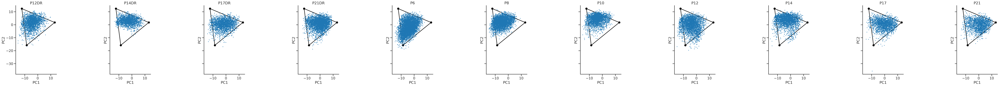

In [38]:
# plot
n = len(todo_conds)
fig, axs = plt.subplots(1,n,figsize=(8*n,6), sharex=True, sharey=True)
for i, cond in enumerate(todo_conds):
    ax = axs[i]
    xp = res[res['cond']==cond][['pcs_later1', 'pcs_later2']].values # pcs_later[:,:2]
    
    ax.scatter(xp[:,0], xp[:,1], s=2) #  c=types_colorvec, s=2)
    plot_archetype(ax, aa, fmt='-o', color='k', zorder=0)
    ax.set_title(cond)

    ax.set_xlabel('PC1')
    ax.set_ylabel('PC2')
    ax.set_aspect('equal')
    sns.despine(ax=ax)
    ax.grid(False)
    
plt.show()

In [39]:
xbins = np.linspace(-6,6,2*12+1)
ybins = np.linspace(-5,5,2*10+1)

xbins, ybins

(array([-6. , -5.5, -5. , -4.5, -4. , -3.5, -3. , -2.5, -2. , -1.5, -1. ,
        -0.5,  0. ,  0.5,  1. ,  1.5,  2. ,  2.5,  3. ,  3.5,  4. ,  4.5,
         5. ,  5.5,  6. ]),
 array([-5. , -4.5, -4. , -3.5, -3. , -2.5, -2. , -1.5, -1. , -0.5,  0. ,
         0.5,  1. ,  1.5,  2. ,  2.5,  3. ,  3.5,  4. ,  4.5,  5. ]))

In [40]:
from scipy.stats import gaussian_kde

In [41]:
# fit KDE

kdes = []
kde_values = []
n = len(todo_conds)
for i, cond in enumerate(todo_conds):
    xp = res[res['cond']==cond][['pcs_later1', 'pcs_later2']].values # pcs_later[:,:2]
    
    # Fit KDE
    kde = gaussian_kde(xp.T)
    kdes.append(kde)
    kde_values.append(kde(xp.T))
    

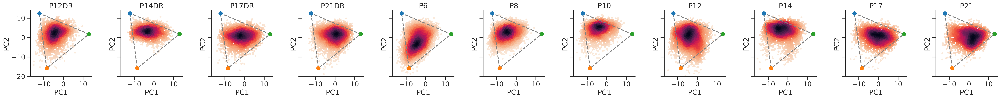

In [54]:
# plot
n = len(todo_conds)
fig, axs = plt.subplots(1,n,figsize=(4*n,3), sharex=True, sharey=True)
for i, cond in enumerate(todo_conds):
    ax = axs[i]
    kde_val = kde_values[i]
    
    xp = res[res['cond']==cond][['pcs_later1', 'pcs_later2']].values # pcs_later[:,:2]
    

    c = kde_val
    
    ax.scatter(xp[:,0], xp[:,1], c=c, s=10, cmap='rocket_r', rasterized=True) #  c=types_colorvec, s=2)
    
    plot_archetype(ax, aa, fmt='--', color='gray', zorder=2)
    ax.scatter(aa[0,0], aa[1,0], color='C0', zorder=2)
    ax.scatter(aa[0,1], aa[1,1], color='C1', zorder=2)
    ax.scatter(aa[0,2], aa[1,2], color='C2', zorder=2)
    
    ax.set_title(cond)
    ax.set_ylim(ymin=-20)

    ax.set_xlabel('PC1')
    ax.set_ylabel('PC2')
    ax.set_aspect('equal')
    sns.despine(ax=ax)
    ax.grid(False)
    # break
    
# output = os.path.join(outdirfig, f'pc12_density.pdf')
# powerplots.savefig_autodate(fig, output)
plt.show()

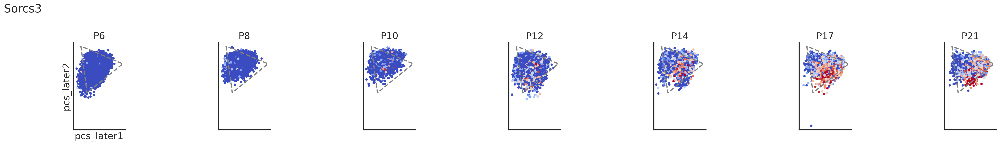

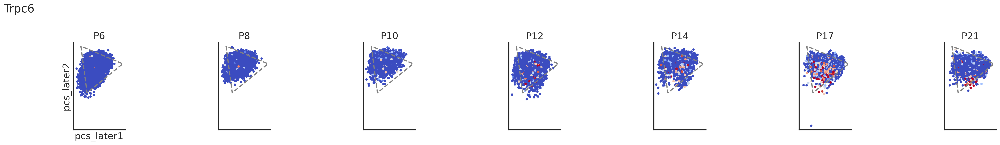

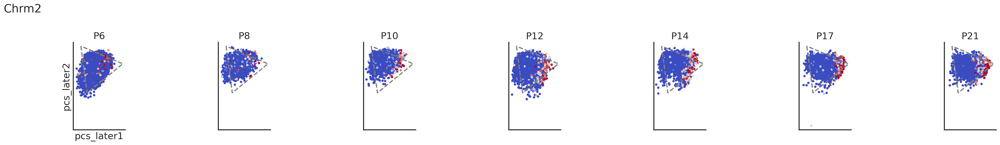

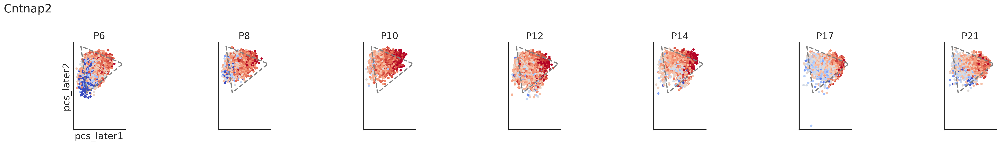

In [43]:
# genes_viz = ['scores_b','scores_c-a']
cases_nr_short = ['P6', 'P8', 'P10', 'P12', 'P14', 'P17', 'P21']
genes_viz = [
    # 'Fos', 'Npas4', 'Arc', 'Bdnf','Nptx2', # A
    'Sorcs3', 'Trpc6', 'Chrm2',
    'Cntnap2',
]

for gn in genes_viz:
    vmin = np.percentile(res[gn],  2)
    vmax = np.percentile(res[gn], 98)
    
    fig = plot3('pcs_later1', 'pcs_later2', gn, aspect_equal=True, s=20, vmin=vmin, vmax=vmax) #vmaxp=98, vminp=2)
    axs = fig.get_axes()
    for ax in axs:
        plot_archetype(ax, aa, fmt='--', color='gray', zorder=2)
    
    # output = os.path.join(outdirfig, f'pc12_{gn}.pdf')
    # powerplots.savefig_autodate(fig, output)
    plt.show()
    
    # break
    

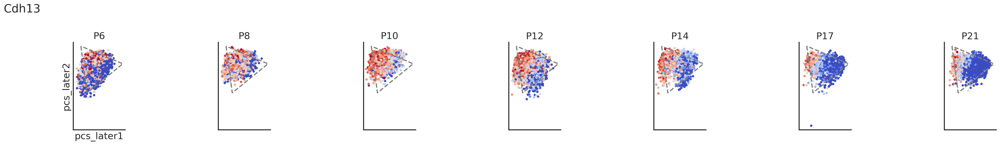

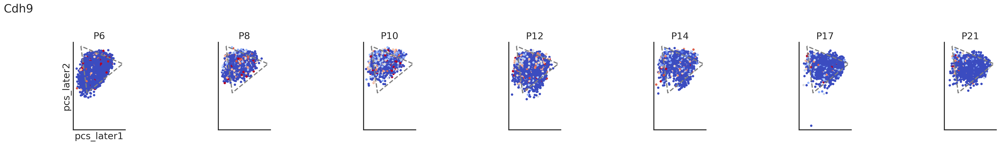

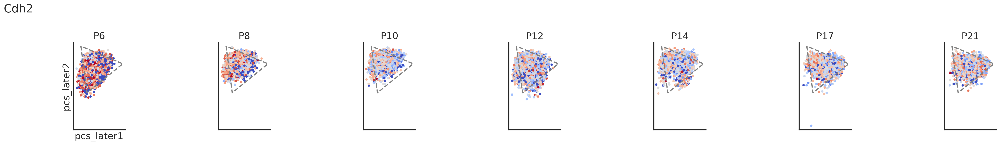

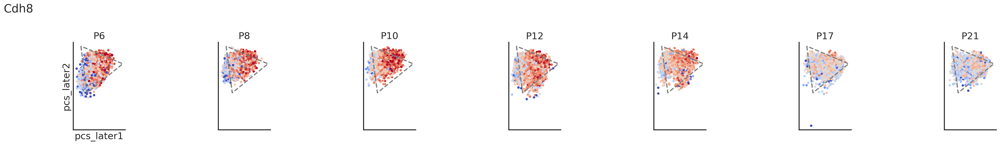

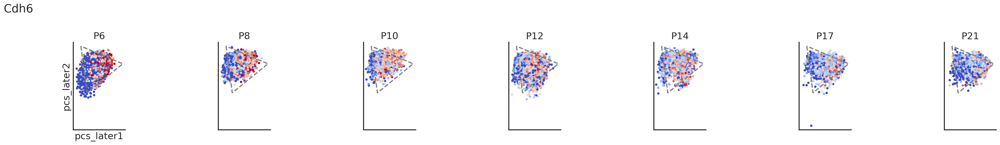

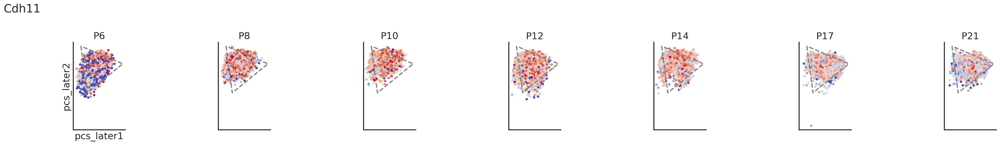

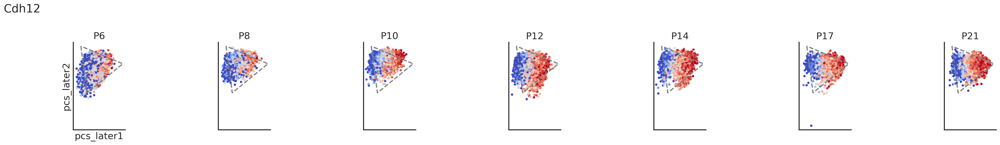

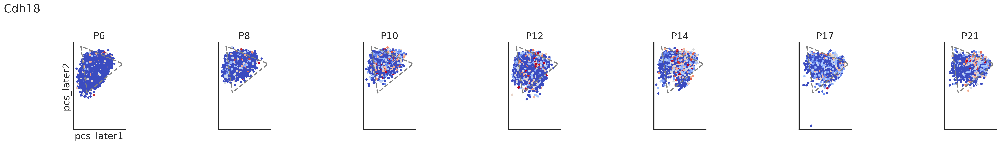

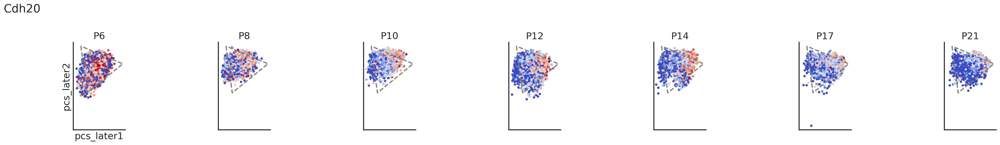

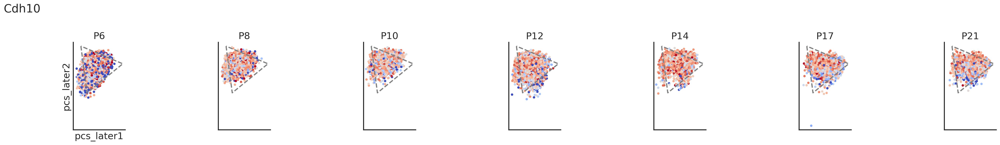

In [44]:
# genes_viz = ['scores_b','scores_c-a']
genes_viz = [
    'Cdh13','Cdh9', 'Cdh2', # A
    'Cdh8', 'Cdh6', 'Cdh11', 'Cdh12', # C
    'Cdh18','Cdh20', # B
    'Cdh10',
]

for gn in genes_viz:
    vmin = np.percentile(res[gn],  2)
    vmax = np.percentile(res[gn], 98)
    
    fig = plot3('pcs_later1', 'pcs_later2', gn, aspect_equal=True, s=20, vmin=vmin, vmax=vmax) #vmaxp=98, vminp=2)
    axs = fig.get_axes()
    for ax in axs:
        plot_archetype(ax, aa, fmt='--', color='gray', zorder=2)
    
    # output = os.path.join(outdirfig, f'pc12_{gn}.pdf')
    # powerplots.savefig_autodate(fig, output)
    plt.show()
    
    # break
    

# Scenic averages 

In [45]:
# scenic metadata
def get_scenic(f):
    df_scenic = pd.read_csv(f, index_col=0)
    df_scenic['signs'] = df_scenic['eRegulon_name'].apply(lambda x: x[-3]+x[-1])
    df_scenic['Consensus_name'] = df_scenic['TF']+df_scenic['signs']
    df_scenic = df_scenic[df_scenic['signs'].isin(["++", "-+"])]
    
    return df_scenic

f1 = '/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/v1_multiome/from_sanjana/L2_3_extended_e_regulon_metadata.csv'
f2 = '/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/v1_multiome/from_sanjana/L4_extended_e_regulon_metadata.csv'
f3 = '/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/v1_multiome/from_sanjana/L5IT_extended_e_regulon_metadata.csv'
f4 = '/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/v1_multiome/from_sanjana/L6IT_extended_e_regulon_metadata.csv'

df_scenic1 = get_scenic(f1)
df_scenic2 = get_scenic(f2)
df_scenic3 = get_scenic(f3)
df_scenic4 = get_scenic(f4)

154


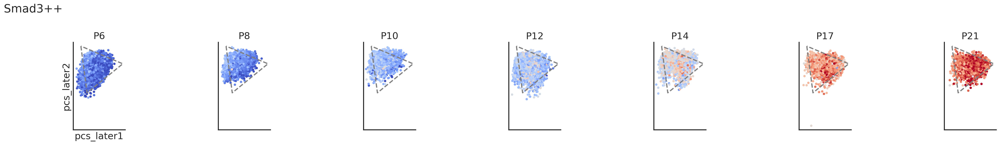

In [46]:
reg_names = [
    # 'Nr3c1++', 
    'Smad3++',
    # 'Fos++', 'Fosb++', 'Fosl2++', 
    # 'Junb++', 'Jund++', 
    # 'Egr1++', 
    # 'Npas4++',
    # 'Jun++', 
    # 'Egr2++', 'Egr3++', 'Egr4++',
]
    
for reg_name in reg_names:
    df_scenic = df_scenic1

    df_this_reg = df_scenic[df_scenic['Consensus_name']==reg_name]
    reg_genes   = df_this_reg['Gene'].unique()
    print(len(reg_genes))

    res[reg_name] = res[reg_genes].mean(axis=1)

    gn = reg_name
    vmin = np.percentile(res[gn],  2)
    vmax = np.percentile(res[gn], 98)

    fig = plot3('pcs_later1', 'pcs_later2', gn, aspect_equal=True, s=20, vmin=vmin, vmax=vmax)
    axs = fig.get_axes()
    for ax in axs:
        plot_archetype(ax, aa, fmt='--', color='gray', zorder=2)

    # output = os.path.join(outdirfig, f'pc12_{gn}.pdf')
    # powerplots.savefig_autodate(fig, output)
    plt.show()


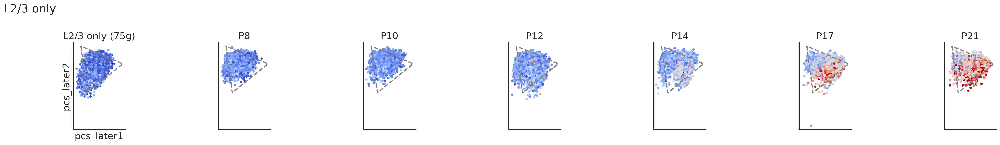

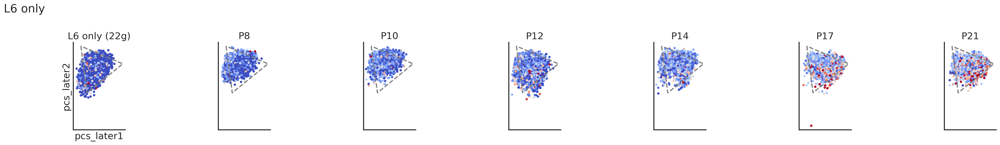

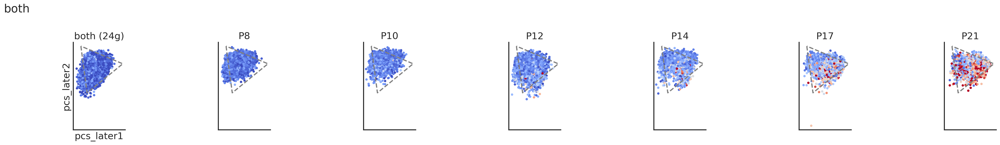

In [47]:
def get_nonoverlap(reg_genes_a, reg_genes_b):
    rg_a  = np.setdiff1d(reg_genes_a, reg_genes_b)
    rg_b  = np.setdiff1d(reg_genes_b, reg_genes_a)
    rg_ab = np.intersect1d(reg_genes_a, reg_genes_b)
    return rg_ab, rg_a, rg_b
    

reg_name = 'Fosb++'
reg_genes1 = np.sort(df_scenic1[df_scenic1['Consensus_name']==reg_name]['Gene'].unique())
reg_genes4 = np.sort(df_scenic4[df_scenic4['Consensus_name']==reg_name]['Gene'].unique())

rg_ab, rg_a, rg_b = get_nonoverlap(reg_genes1, reg_genes4)
for reg_name, reg_genes in zip(["L2/3 only", "L6 only", "both"], [rg_a, rg_b, rg_ab]):

    res[reg_name] = res[reg_genes].mean(axis=1)

    gn = reg_name
    vmin = np.percentile(res[gn],  2)
    vmax = np.percentile(res[gn], 98)

    fig = plot3('pcs_later1', 'pcs_later2', gn, aspect_equal=True, s=20, vmin=vmin, vmax=vmax)
    axs = fig.get_axes()
    for ax in axs:
        plot_archetype(ax, aa, fmt='--', color='gray', zorder=2)

    title = reg_name + f' ({len(reg_genes)}g)'
    axs[0].set_title(title)
    # output = os.path.join(outdirfig, f'pc12_{gn}.pdf')
    # powerplots.savefig_autodate(fig, output)
    plt.show()

In [48]:
# Combination of all IEGs
classic_iegs = [
    'Fos', 'Fosb', 'Fosl1', 'Fosl2', 
    'Jun', 'Junb', 'Jund',
    'Egr1',
    'Smad3',
    'Npas4',
]

df_scenic_list = [
    df_scenic1, 
    df_scenic2, 
    df_scenic3, 
    df_scenic4, 
]

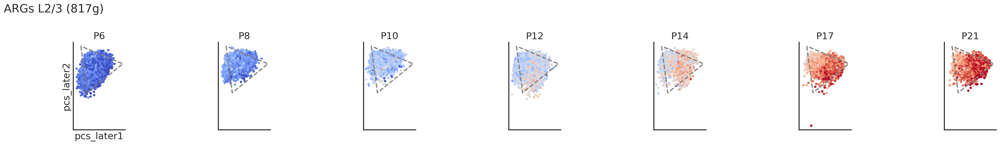

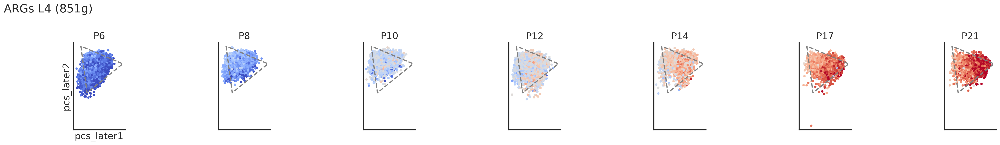

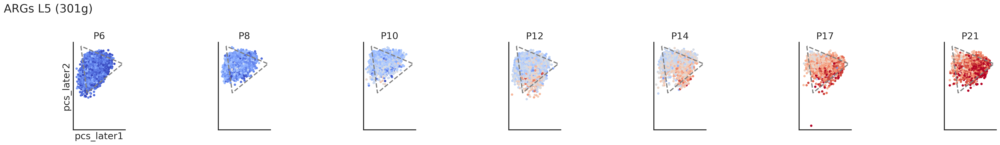

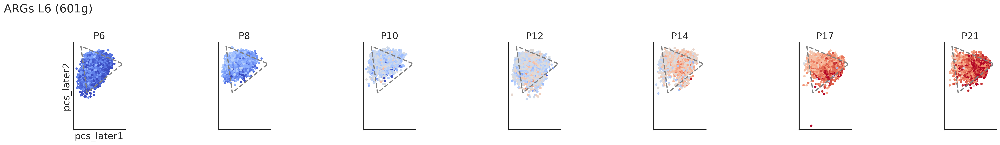

In [49]:
reg_name_list = classic_iegs
for reg_name, df_scenic in zip(
    ['ARGs L2/3', 'ARGs L4', 'ARGs L5', 'ARGs L6',],
    df_scenic_list):

    df_this_reg = df_scenic[df_scenic['Consensus_name'].isin(np.char.add(classic_iegs, '++'))]
    reg_genes   = df_this_reg['Gene'].unique()
    
    reg_name = reg_name + f' ({len(reg_genes)}g)'
    res[reg_name] = res[reg_genes].mean(axis=1)

    gn = reg_name
    vmin = np.percentile(res[gn],  2)
    vmax = np.percentile(res[gn], 98)

    fig = plot3('pcs_later1', 'pcs_later2', gn, aspect_equal=True, s=20, vmin=vmin, vmax=vmax)
    axs = fig.get_axes()
    for ax in axs:
        plot_archetype(ax, aa, fmt='--', color='gray', zorder=2)

    # output = os.path.join(outdirfig, f'pc12_{gn}.pdf')
    # powerplots.savefig_autodate(fig, output)
    plt.show()

In [50]:
outdir = '/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/v1_multiome'
reg_name_list = classic_iegs
for reg_name, df_scenic in zip(
    ['ARGs L2/3', 'ARGs L4', 'ARGs L5', 'ARGs L6',],
    df_scenic_list):
    
    fout = f"{outdir}/target_genes_{reg_name.replace('/','').replace(' ', '_')}.txt"
    print(fout)

    df_this_reg = df_scenic[df_scenic['Consensus_name'].isin(np.char.add(classic_iegs, '++'))]
    reg_genes   = df_this_reg['Gene'].unique()
    
    np.savetxt(fout, reg_genes, fmt='%s')


/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/v1_multiome/target_genes_ARGs_L23.txt
/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/v1_multiome/target_genes_ARGs_L4.txt
/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/v1_multiome/target_genes_ARGs_L5.txt
/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/v1_multiome/target_genes_ARGs_L6.txt
